In [1]:
import pandas as pd

In [2]:
sales = pd.read_csv("E:\Guvi\Projects\Dominos\Pizza_Sale - pizza_sales.csv")

In [3]:
ingredients = pd.read_csv("E:\Guvi\Projects\Dominos\Pizza_ingredients - Pizza_ingredients.csv")

In [4]:
sales.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_ingredients,pizza_name
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,"Sliced Ham, Pineapple, Mozzarella Cheese",The Hawaiian Pizza
1,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,"Pepperoni, Mushrooms, Red Onions, Red Peppers,...",The Classic Deluxe Pizza
2,3,2,five_cheese_l,1,1/1/2015,11:57:40,18.50,18.50,L,Veggie,"Mozzarella Cheese, Provolone Cheese, Smoked Go...",The Five Cheese Pizza
3,4,2,ital_supr_l,1,1/1/2015,11:57:40,20.75,20.75,L,Supreme,"Calabrese Salami, Capocollo, Tomatoes, Red Oni...",The Italian Supreme Pizza
4,5,2,mexicana_m,1,1/1/2015,11:57:40,16.00,16.00,M,Veggie,"Tomatoes, Red Peppers, Jalapeno Peppers, Red O...",The Mexicana Pizza


In [5]:
ingredients.head()

,pizza_name_id,pizza_name,pizza_ingredients,Items_Qty_In_Grams
0,bbq_ckn_l,The Barbecue Chicken Pizza,Barbecued Chicken,40.0
1,bbq_ckn_l,The Barbecue Chicken Pizza,Red Peppers,15.0
2,bbq_ckn_l,The Barbecue Chicken Pizza,Green Peppers,20.0
3,bbq_ckn_l,The Barbecue Chicken Pizza,Tomatoes,30.0
4,bbq_ckn_l,The Barbecue Chicken Pizza,Red Onions,60.0


In [6]:
sales.isnull().sum()

pizza_id              0
order_id              0
pizza_name_id        16
quantity              0
order_date            0
order_time            0
unit_price            0
total_price           7
pizza_size            0
pizza_category       23
pizza_ingredients    13
pizza_name            7
dtype: int64

In [7]:
ingredients.isnull().sum()

pizza_name_id         0
pizza_name            0
pizza_ingredients     0
Items_Qty_In_Grams    4
dtype: int64

In [8]:
# Create a reference dictionary to map pizza_name_id to pizza_name
pizza_reference = ingredients[['pizza_name_id', 'pizza_name']].drop_duplicates()

# Convert the reference dataframe to a dictionary
pizza_reference_dict = pizza_reference.set_index('pizza_name_id')['pizza_name'].to_dict()

In [9]:
# Function to fill missing pizza_name_id based on pizza_name
def fill_missing_pizza_name_id(row):
    if pd.isnull(row['pizza_name_id']):
        # If pizza_name_id is missing, lookup the pizza_name and fill it
        return [key for key, value in pizza_reference_dict.items() if value == row['pizza_name']][0]  # Return the first matching pizza_name_id
    return row['pizza_name_id']  # If not missing, return the original value

# Apply the function to fill missing pizza_name_id in sales
sales['pizza_name_id'] = sales.apply(fill_missing_pizza_name_id, axis=1)

In [10]:
# Fill missing pizza_name based on pizza_name_id
sales['pizza_name'] = sales['pizza_name'].fillna(sales['pizza_name_id'].map(pizza_reference_dict))

In [11]:
sales.isnull().sum()

pizza_id              0
order_id              0
pizza_name_id         0
quantity              0
order_date            0
order_time            0
unit_price            0
total_price           7
pizza_size            0
pizza_category       23
pizza_ingredients    13
pizza_name            0
dtype: int64

In [12]:
# Fill missing total_price by multiplying quantity and unit_price
sales['total_price'] = sales['total_price'].fillna(sales['quantity'] * sales['unit_price'])

In [13]:
# Create a function to fill missing pizza_ingredients based on pizza_name_id
def fill_missing_pizza_ingredients(row):
    if pd.isnull(row['pizza_ingredients']):
        # Get ingredients for the corresponding pizza_name_id from the ingredients dataset
        ingredients_list = ingredients[ingredients['pizza_name_id'] == row['pizza_name_id']]['pizza_ingredients'].tolist()
        
        # Join the ingredients into a comma-separated string
        return ', '.join(ingredients_list) if ingredients_list else 'Unknown'
    return row['pizza_ingredients']

# Apply the function to fill missing pizza_ingredients in the sales dataset
sales['pizza_ingredients'] = sales.apply(fill_missing_pizza_ingredients, axis=1)

In [14]:
sales.isnull().sum()

pizza_id              0
order_id              0
pizza_name_id         0
quantity              0
order_date            0
order_time            0
unit_price            0
total_price           0
pizza_size            0
pizza_category       23
pizza_ingredients     0
pizza_name            0
dtype: int64

In [15]:
# Find the most frequent pizza_category for each pizza_name
mode_category = sales.groupby('pizza_name')['pizza_category'].agg(lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')

# Print out the mode_category for reference
print(mode_category.head())

pizza_name
The Barbecue Chicken Pizza      Chicken
The Big Meat Pizza              Classic
The Brie Carre Pizza            Supreme
The Calabrese Pizza             Supreme
The California Chicken Pizza    Chicken
Name: pizza_category, dtype: object


In [16]:
# Fill missing pizza_category by using the mode for each pizza_name
sales['pizza_category'] = sales.apply(
    lambda row: mode_category.get(row['pizza_name'], 'Unknown') if pd.isnull(row['pizza_category']) else row['pizza_category'],
    axis=1
)

In [17]:
sales.isnull().sum()

pizza_id             0
order_id             0
pizza_name_id        0
quantity             0
order_date           0
order_time           0
unit_price           0
total_price          0
pizza_size           0
pizza_category       0
pizza_ingredients    0
pizza_name           0
dtype: int64

In [18]:
ingredients.isnull().sum()

pizza_name_id         0
pizza_name            0
pizza_ingredients     0
Items_Qty_In_Grams    4
dtype: int64

In [19]:
# Check for basic stats of Items_Qty_In_Grams to decide on imputation strategy
ingredients['Items_Qty_In_Grams'].describe()

count    514.000000
mean      30.564202
std       30.351623
min        5.000000
25%       10.000000
50%       20.000000
75%       40.000000
max      200.000000
Name: Items_Qty_In_Grams, dtype: float64

In [20]:
# Fill missing values in Items_Qty_In_Grams with the median value (20.00 grams)
ingredients['Items_Qty_In_Grams'].fillna(ingredients['Items_Qty_In_Grams'].median())

0      40.0
1      15.0
2      20.0
3      30.0
4      60.0
       ... 
513    20.0
514    20.0
515    10.0
516    15.0
517     5.0
Name: Items_Qty_In_Grams, Length: 518, dtype: float64

In [21]:
ingredients.isnull().sum()

pizza_name_id         0
pizza_name            0
pizza_ingredients     0
Items_Qty_In_Grams    4
dtype: int64

In [22]:
sales.shape

(48620, 12)

In [23]:
sales_duplicate = sales[sales.duplicated(keep=False)]

In [24]:
sales_duplicate.shape

(0, 12)

In [25]:
sales.shape

(48620, 12)

In [26]:
ingredients.shape

(518, 4)

In [27]:
ingredients_duplicate = ingredients[ingredients.duplicated(keep=False)]

In [28]:
ingredients_duplicate.shape

(0, 4)

In [29]:
ingredients.shape

(518, 4)

In [30]:
merged_data = pd.merge(sales, ingredients, on='pizza_name_id', how='left')

In [31]:
merged_data.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_ingredients_x,pizza_name_x,pizza_name_y,pizza_ingredients_y,Items_Qty_In_Grams
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,"Sliced Ham, Pineapple, Mozzarella Cheese",The Hawaiian Pizza,The Hawaiian Pizza,Sliced Ham,NaN
1,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,"Sliced Ham, Pineapple, Mozzarella Cheese",The Hawaiian Pizza,The Hawaiian Pizza,Pineapple,30.0
2,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,"Sliced Ham, Pineapple, Mozzarella Cheese",The Hawaiian Pizza,The Hawaiian Pizza,Mozzarella Cheese,20.0
3,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,"Pepperoni, Mushrooms, Red Onions, Red Peppers,...",The Classic Deluxe Pizza,The Classic Deluxe Pizza,Pepperoni,40.0
4,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,"Pepperoni, Mushrooms, Red Onions, Red Peppers,...",The Classic Deluxe Pizza,The Classic Deluxe Pizza,Mushrooms,40.0


In [32]:
merged_data = merged_data.drop(columns=['pizza_name_x', 'pizza_ingredients_x'])

In [33]:
merged_data.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_name_y,pizza_ingredients_y,Items_Qty_In_Grams
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Sliced Ham,NaN
1,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Pineapple,30.0
2,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Mozzarella Cheese,20.0
3,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Pepperoni,40.0
4,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Mushrooms,40.0


In [34]:
merged_data.rename(columns={'pizza_name_y': 'pizza_name', 'pizza_ingredients_y': 'pizza_ingredients'}, inplace=True)

In [35]:
merged_data.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_name,pizza_ingredients,Items_Qty_In_Grams
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Sliced Ham,NaN
1,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Pineapple,30.0
2,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Mozzarella Cheese,20.0
3,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Pepperoni,40.0
4,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Mushrooms,40.0


In [36]:
merged_data.shape

(267576, 13)

In [37]:
# Check for outliers in each ingredient type using IQR
ingredient_groups = ingredients.groupby('pizza_ingredients')

# Loop through each ingredient group and calculate IQR-based outliers
outlier_rows = []

for ingredient, group in ingredient_groups:
    Q1 = group['Items_Qty_In_Grams'].quantile(0.25)
    Q3 = group['Items_Qty_In_Grams'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = group[(group['Items_Qty_In_Grams'] < lower_bound) | (group['Items_Qty_In_Grams'] > upper_bound)]
    outlier_rows.append(outliers)

# Combine all outliers into a single DataFrame
outliers_data = pd.concat(outlier_rows)
print(outliers_data)

Empty DataFrame
Columns: [pizza_name_id, pizza_name, pizza_ingredients, Items_Qty_In_Grams]
Index: []


In [38]:
from scipy.stats import zscore

# Apply Z-score to detect outliers
ingredients['z_score'] = ingredients.groupby('pizza_ingredients')['Items_Qty_In_Grams'].transform(zscore)

# Define a threshold for Z-score (commonly, a Z-score > 3 or < -3 is considered an outlier)
outliers_zscore = ingredients[ingredients['z_score'].abs() > 3]
print(outliers_zscore)

     pizza_name_id       pizza_name pizza_ingredients  Items_Qty_In_Grams  \
490  the_greek_xxl  The Greek Pizza          Tomatoes                50.0   
491  the_greek_xxl  The Greek Pizza            Garlic                25.0   

      z_score  
490  3.125957  
491  3.110440  


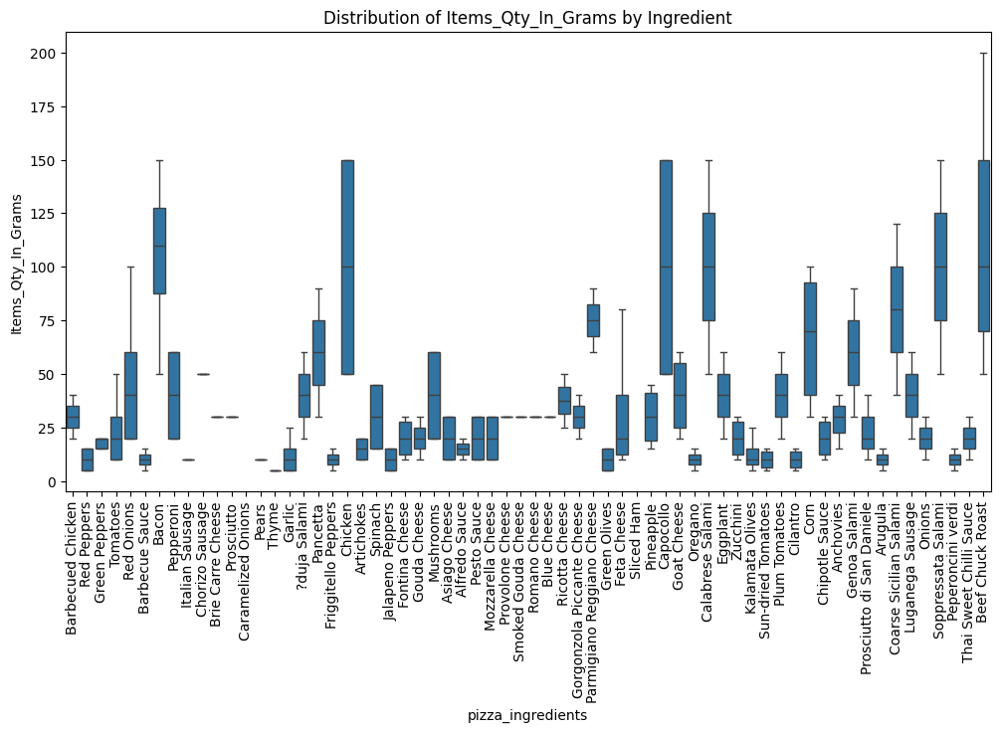

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualizing the distribution of Items_Qty_In_Grams for each ingredient
plt.figure(figsize=(12, 6))
sns.boxplot(x='pizza_ingredients', y='Items_Qty_In_Grams', data=ingredients)
plt.xticks(rotation=90)
plt.title('Distribution of Items_Qty_In_Grams by Ingredient')
plt.show()

In [40]:
# Example: Check IQR calculation for one group (e.g., 'Chicken')
ingredient_group = ingredients[ingredients['pizza_ingredients'] == 'Chicken']
Q1 = ingredient_group['Items_Qty_In_Grams'].quantile(0.25)
Q3 = ingredient_group['Items_Qty_In_Grams'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Lower Bound: {lower_bound}, Upper Bound: {upper_bound}")
print(ingredient_group[(ingredient_group['Items_Qty_In_Grams'] < lower_bound) | 
                       (ingredient_group['Items_Qty_In_Grams'] > upper_bound)])

Q1: 50.0, Q3: 150.0, IQR: 100.0, Lower Bound: -100.0, Upper Bound: 300.0
Empty DataFrame
Columns: [pizza_name_id, pizza_name, pizza_ingredients, Items_Qty_In_Grams, z_score]
Index: []


In [41]:
from scipy.stats import zscore

# Calculate Z-scores
ingredients['z_score'] = ingredients.groupby('pizza_ingredients')['Items_Qty_In_Grams'].transform(zscore)

# Define a threshold for Z-score (commonly > 3 or < -3)
outliers_zscore = ingredients[ingredients['z_score'].abs() > 3]
print(outliers_zscore)

     pizza_name_id       pizza_name pizza_ingredients  Items_Qty_In_Grams  \
490  the_greek_xxl  The Greek Pizza          Tomatoes                50.0   
491  the_greek_xxl  The Greek Pizza            Garlic                25.0   

      z_score  
490  3.125957  
491  3.110440  


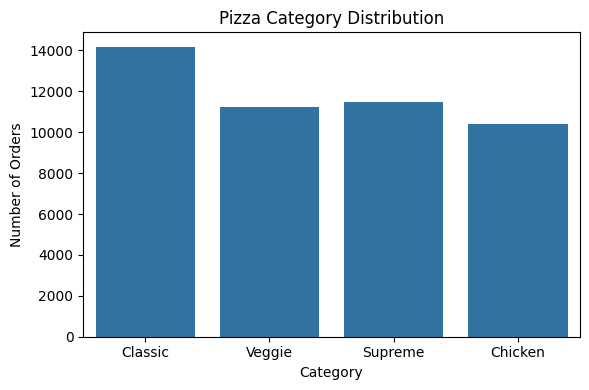

In [42]:
# 1. Pizza Category Distribution
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6,4))
sns.countplot(data=merged_data.drop_duplicates(subset=['order_id', 'pizza_name']), x='pizza_category')
plt.title('Pizza Category Distribution')
plt.xlabel('Category')
plt.ylabel('Number of Orders')
plt.tight_layout()
plt.show()

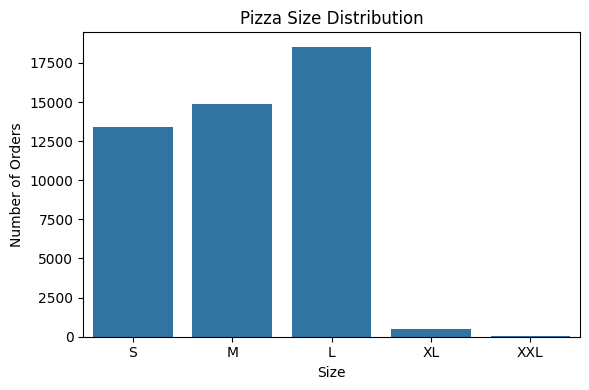

In [43]:
# 2. Pizza Size Distribution
plt.figure(figsize=(6,4))
sns.countplot(data=merged_data.drop_duplicates(subset=['order_id', 'pizza_name']), x='pizza_size', 
              order=['S','M','L','XL','XXL'])
plt.title('Pizza Size Distribution')
plt.xlabel('Size')
plt.ylabel('Number of Orders')
plt.tight_layout()
plt.show()

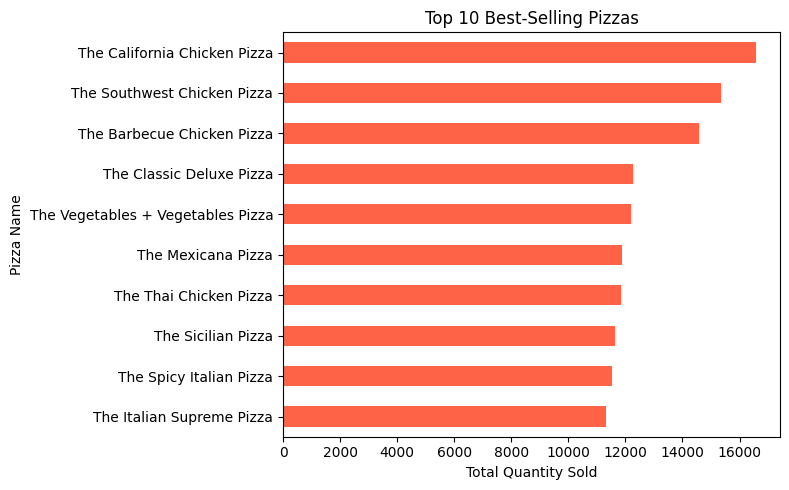

In [44]:
# 3. Top 10 Best-Selling Pizzas by Quantity
top_pizzas = merged_data.groupby('pizza_name')['quantity'].sum().sort_values(ascending=False).head(10)

plt.figure(figsize=(8,5))
top_pizzas.plot(kind='barh', color='tomato')
plt.title('Top 10 Best-Selling Pizzas')
plt.xlabel('Total Quantity Sold')
plt.ylabel('Pizza Name')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

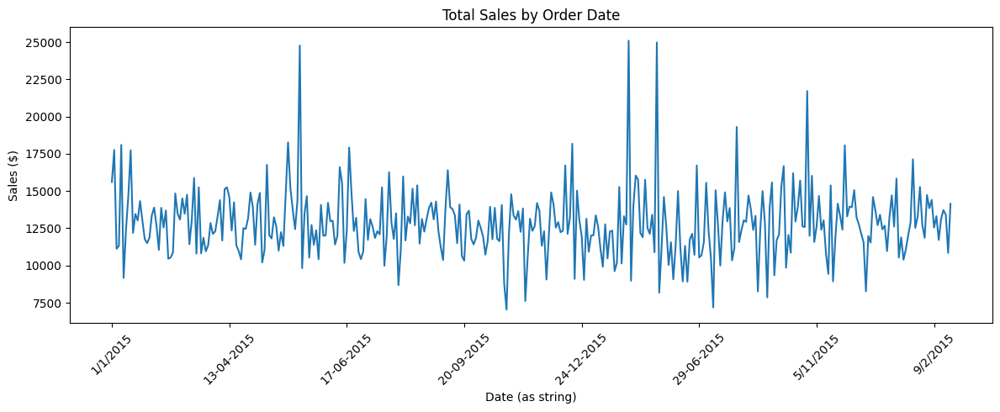

In [45]:
# 4. Total Sales per Date (as-is)
daily_sales = merged_data.groupby('order_date')['total_price'].sum()

plt.figure(figsize=(12,5))
daily_sales.plot()
plt.title('Total Sales by Order Date')
plt.xlabel('Date (as string)')
plt.ylabel('Sales ($)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

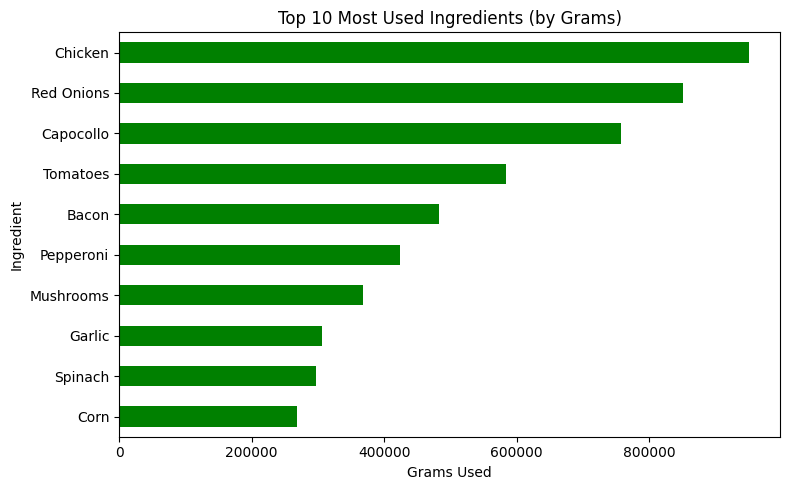

In [46]:
#  5. Top Ingredients by Total Grams Used
top_ingredients = merged_data.groupby('pizza_ingredients')['Items_Qty_In_Grams'].sum().sort_values(ascending=False).head(10)

plt.figure(figsize=(8,5))
top_ingredients.plot(kind='barh', color='green')
plt.title('Top 10 Most Used Ingredients (by Grams)')
plt.xlabel('Grams Used')
plt.ylabel('Ingredient')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

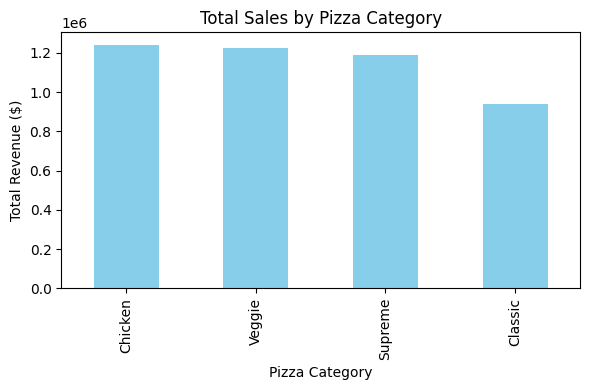

In [47]:
#  6. Sales by Pizza Category
category_sales = merged_data.groupby('pizza_category')['total_price'].sum().sort_values(ascending=False)

plt.figure(figsize=(6,4))
category_sales.plot(kind='bar', color='skyblue')
plt.title('Total Sales by Pizza Category')
plt.ylabel('Total Revenue ($)')
plt.xlabel('Pizza Category')
plt.tight_layout()
plt.show()

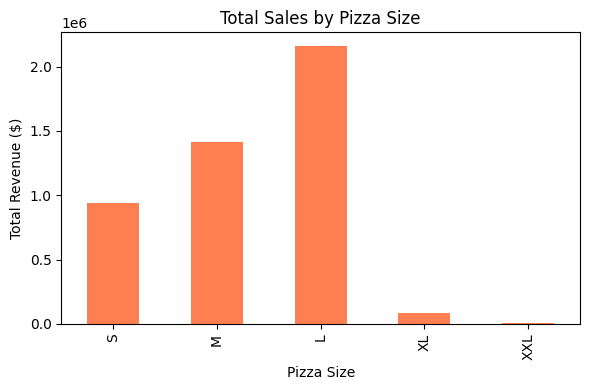

In [48]:
# 7. Sales by Pizza Size
size_sales = merged_data.groupby('pizza_size')['total_price'].sum().reindex(['S', 'M', 'L', 'XL', 'XXL'])

plt.figure(figsize=(6,4))
size_sales.plot(kind='bar', color='coral')
plt.title('Total Sales by Pizza Size')
plt.ylabel('Total Revenue ($)')
plt.xlabel('Pizza Size')
plt.tight_layout()
plt.show()

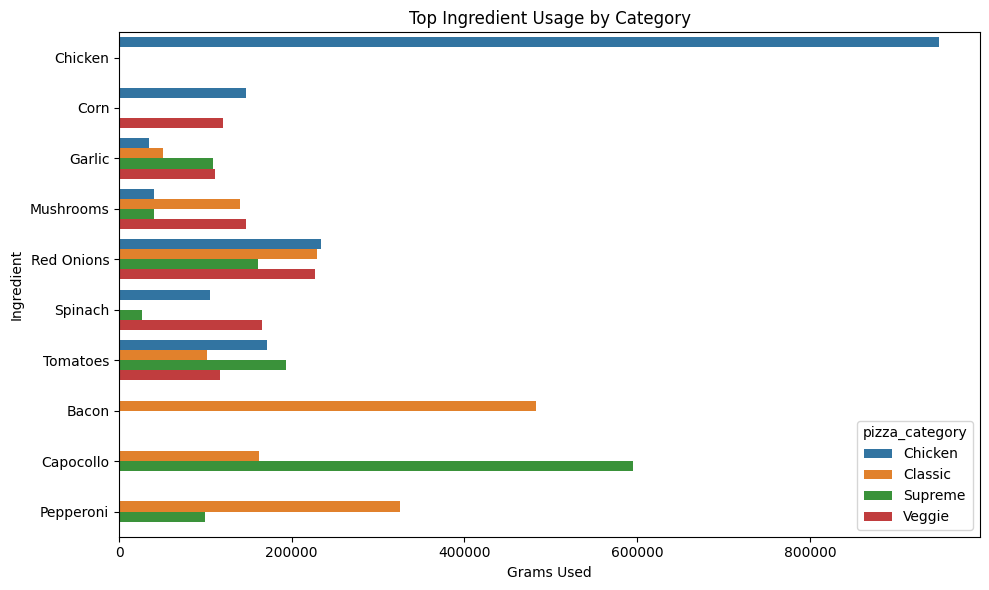

In [49]:
# 8. Ingredient Usage by Category
ingredient_by_category = merged_data.groupby(['pizza_category', 'pizza_ingredients'])['Items_Qty_In_Grams'].sum().reset_index()

plt.figure(figsize=(10,6))
top = ingredient_by_category.groupby('pizza_ingredients')['Items_Qty_In_Grams'].sum().sort_values(ascending=False).head(10).index
sns.barplot(data=ingredient_by_category[ingredient_by_category['pizza_ingredients'].isin(top)],
            x='Items_Qty_In_Grams', y='pizza_ingredients', hue='pizza_category')
plt.title('Top Ingredient Usage by Category')
plt.xlabel('Grams Used')
plt.ylabel('Ingredient')
plt.tight_layout()
plt.show()

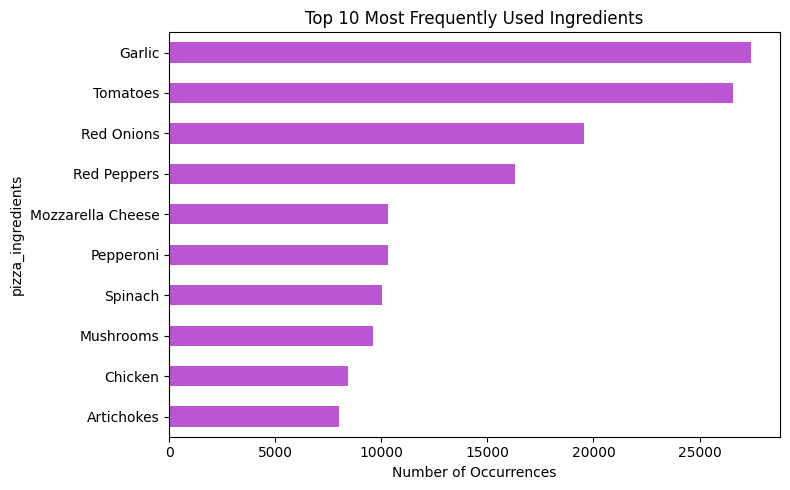

In [50]:
# 9. Most Frequently Used Ingredients (by count)
ingredient_counts = merged_data['pizza_ingredients'].value_counts().head(10)

plt.figure(figsize=(8,5))
ingredient_counts.plot(kind='barh', color='mediumorchid')
plt.title('Top 10 Most Frequently Used Ingredients')
plt.xlabel('Number of Occurrences')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

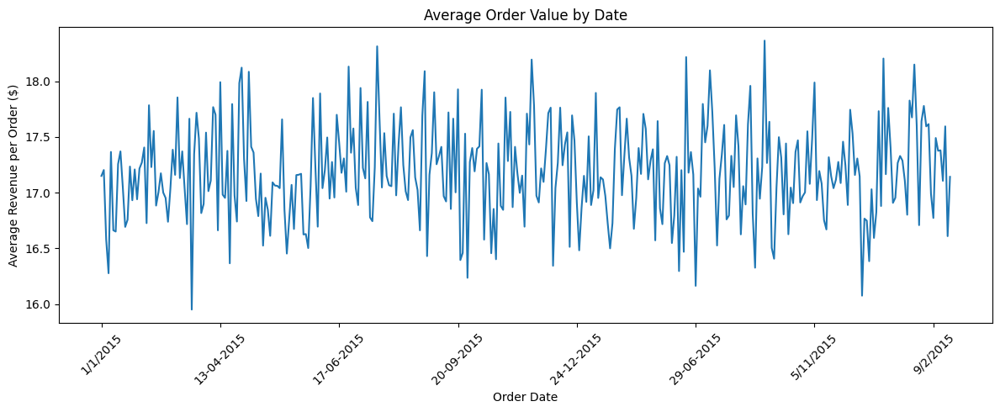

In [51]:
# 10. Average Order Value per Day
avg_order_value = merged_data.groupby('order_date')['total_price'].mean()

plt.figure(figsize=(12,5))
avg_order_value.plot()
plt.title('Average Order Value by Date')
plt.xlabel('Order Date')
plt.ylabel('Average Revenue per Order ($)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [52]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267576 entries, 0 to 267575
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   pizza_id            267576 non-null  int64  
 1   order_id            267576 non-null  int64  
 2   pizza_name_id       267576 non-null  object 
 3   quantity            267576 non-null  int64  
 4   order_date          267576 non-null  object 
 5   order_time          267576 non-null  object 
 6   unit_price          267576 non-null  float64
 7   total_price         267576 non-null  float64
 8   pizza_size          267576 non-null  object 
 9   pizza_category      267576 non-null  object 
 10  pizza_name          267576 non-null  object 
 11  pizza_ingredients   267576 non-null  object 
 12  Items_Qty_In_Grams  264726 non-null  float64
dtypes: float64(3), int64(3), object(7)
memory usage: 26.5+ MB


In [53]:
merged_data.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_name,pizza_ingredients,Items_Qty_In_Grams
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Sliced Ham,NaN
1,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Pineapple,30.0
2,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Mozzarella Cheese,20.0
3,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Pepperoni,40.0
4,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Mushrooms,40.0


In [54]:
merged_data['order_datetime'] = pd.to_datetime(
    merged_data['order_date'] + ' ' + merged_data['order_time'],
    format='mixed',
    dayfirst=True,
    errors='coerce'
)

In [55]:
print("Unparsed rows:", merged_data['order_datetime'].isna().sum())

Unparsed rows: 0


In [56]:
# Extracting parts from datetime
merged_data['date'] = merged_data['order_datetime'].dt.date
merged_data['day_of_week'] = merged_data['order_datetime'].dt.day_name()
merged_data['month'] = merged_data['order_datetime'].dt.month_name()
merged_data['order_hour'] = merged_data['order_datetime'].dt.hour
merged_data['is_weekend'] = merged_data['order_datetime'].dt.dayofweek >= 5  # 5 = Saturday, 6 = Sunday

In [57]:
merged_data.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_name,pizza_ingredients,Items_Qty_In_Grams,order_datetime,date,day_of_week,month,order_hour,is_weekend
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Sliced Ham,NaN,2015-01-01 11:38:36,2015-01-01,Thursday,January,11,False
1,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Pineapple,30.0,2015-01-01 11:38:36,2015-01-01,Thursday,January,11,False
2,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Mozzarella Cheese,20.0,2015-01-01 11:38:36,2015-01-01,Thursday,January,11,False
3,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Pepperoni,40.0,2015-01-01 11:57:40,2015-01-01,Thursday,January,11,False
4,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Mushrooms,40.0,2015-01-01 11:57:40,2015-01-01,Thursday,January,11,False


In [58]:
daily_data = merged_data.groupby('date').agg({
    'total_price': 'sum',
    'quantity': 'sum'
}).reset_index()

# Add back time-based features from one representative row per day
daily_features = merged_data.drop_duplicates(subset=['date'])[['date', 'day_of_week', 'month', 'is_weekend']]
daily_data = pd.merge(daily_data, daily_features, on='date', how='left')

In [59]:
daily_data.head()

,date,total_price,quantity,day_of_week,month,is_weekend
0,2015-01-01,15606.00,917,Thursday,January,False
1,2015-01-02,15379.00,906,Friday,January,False
2,2015-01-03,15047.65,871,Saturday,January,True
3,2015-01-04,9847.30,586,Sunday,January,True
4,2015-01-05,11573.30,687,Monday,January,False


In [60]:
from prophet import Prophet

In [61]:
# Prepare data for Prophet
prophet_data = daily_data[['date', 'total_price']].rename(columns={
    'date': 'ds',
    'total_price': 'y'
})

In [62]:
# Initialize model
model = Prophet()

# Fit model to data
model.fit(prophet_data)

15:35:07 - cmdstanpy - INFO - Chain [1] start processing
15:35:08 - cmdstanpy - INFO - Chain [1] done processing


In [63]:
# Create future dataframe for next 30 days
future = model.make_future_dataframe(periods=30)

# Make forecast
forecast = model.predict(future)

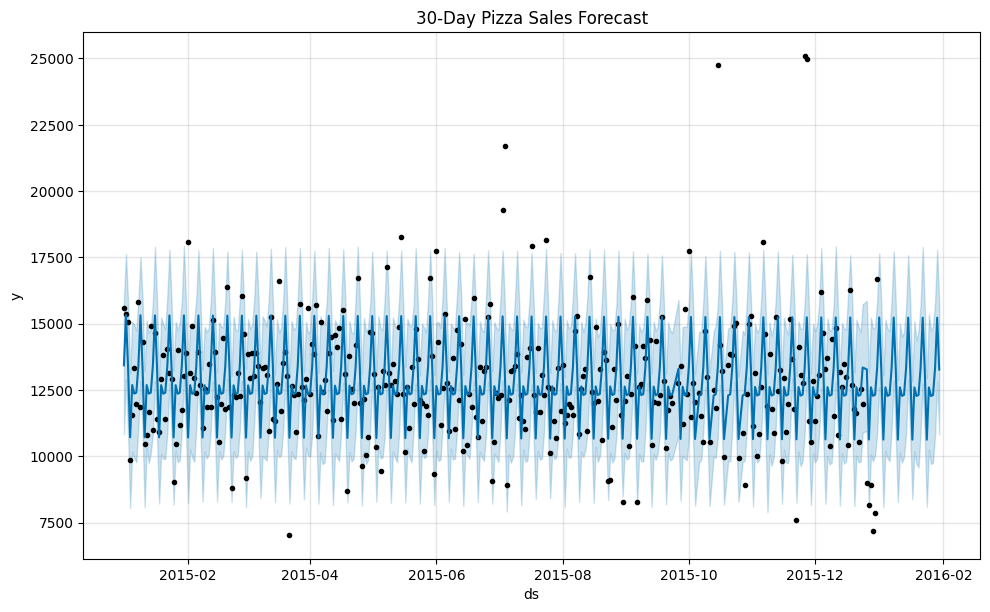

In [64]:
# Forecast plot
model.plot(forecast)
plt.title("30-Day Pizza Sales Forecast")
plt.show()

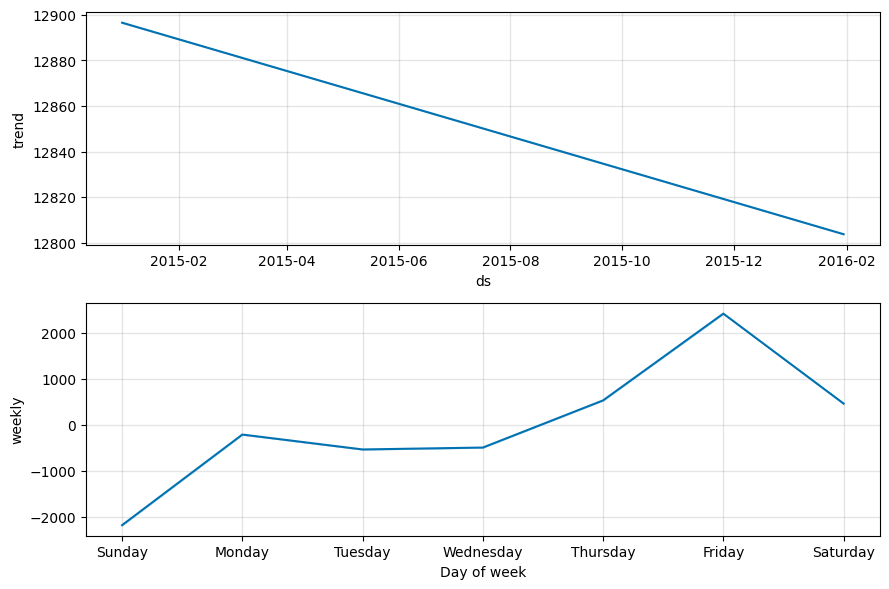

In [65]:
model.plot_components(forecast)
plt.show()

In [66]:
forecast_df_prophet = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

In [67]:
import numpy as np

In [68]:
# Merge real vs predicted (excluding future dates)
compare = prophet_data.copy()
compare['yhat'] = forecast.loc[:len(compare)-1, 'yhat'].values

# Example metric: MAPE
def mape(actual, predicted):
    return np.mean(np.abs((actual - predicted) / actual)) * 100

print("MAPE:", mape(compare['y'], compare['yhat']))

MAPE: 10.468205606862488


In [69]:
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [70]:
# Set index as datetime for ARIMA
ts_data = daily_data.copy()
ts_data['date'] = pd.to_datetime(ts_data['date'])
ts_data.set_index('date', inplace=True)

# We'll forecast 'total_price'
ts_series = ts_data['total_price']

In [71]:
result = adfuller(ts_series)
print("ADF Statistic:", result[0])
print("p-value:", result[1])

ADF Statistic: -3.979475681763765
p-value: 0.0015218790194773363


In [72]:
stepwise_model = auto_arima(
    ts_series,
    seasonal=True,
    m=7,  # weekly seasonality
    trace=True,
    suppress_warnings=True
)
stepwise_model.summary()

C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[7] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=6570.261, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=6552.800, Time=0.18 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=6545.417, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=7803.318, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[7] intercept   : AIC=6567.860, Time=0.02 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,0,1)(1,0,1)[7] intercept   : AIC=6547.221, Time=0.33 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,0,1)(0,0,2)[7] intercept   : AIC=6529.579, Time=0.28 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,0,1)(1,0,2)[7] intercept   : AIC=6533.494, Time=0.56 sec
 ARIMA(0,0,0)(0,0,2)[7] intercept   : AIC=6534.327, Time=0.08 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,0,1)(0,0,2)[7] intercept   : AIC=6533.514, Time=0.16 sec
 ARIMA(0,0,2)(0,0,2)[7] intercept   : AIC=6533.314, Time=0.14 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,0,0)(0,0,2)[7] intercept   : AIC=6532.247, Time=0.12 sec
 ARIMA(1,0,2)(0,0,2)[7] intercept   : AIC=6534.676, Time=0.20 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,0,1)(0,0,2)[7]             : AIC=7085.824, Time=0.35 sec

Best model:  ARIMA(0,0,1)(0,0,2)[7] intercept
Total fit time: 3.211 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      y   No. Observations:                  358
Model:             SARIMAX(0, 0, 1)x(0, 0, [1, 2], 7)   Log Likelihood               -3259.789
Date:                                Sun, 27 Apr 2025   AIC                           6529.579
Time:                                        15:35:35   BIC                           6548.982
Sample:                                             0   HQIC                          6537.295
                                                - 358                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    1.28e+04    209.442     61.136      0.000    1.24e+04    1.32e+04
ma.L1          0.1112      0.039      2.856      0.004       0.035       0.188
ma.S.L7        0.2189      0.053      4.165      0.000       0.116       0.322
ma.S.L14       0.2172      0.054      4.045      0.000       0.112       0.322
sigma2      4.735e+06   2.39e+05     19.823      0.000    4.27e+06     5.2e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               584.25
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               2.23   Skew:                             1.36
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [73]:
# Fit SARIMA model
model = SARIMAX(ts_series, order=stepwise_model.order, seasonal_order=stepwise_model.seasonal_order)
sarima_result = model.fit()

# Forecast
n_periods = 30
forecast = sarima_result.get_forecast(steps=n_periods)
forecast_index = pd.date_range(ts_series.index[-1] + pd.Timedelta(days=1), periods=n_periods)

forecast_df = pd.DataFrame({
    'date': forecast_index,
    'forecast': forecast.predicted_mean,
    'lower_ci': forecast.conf_int().iloc[:, 0],
    'upper_ci': forecast.conf_int().iloc[:, 1]
})

C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported

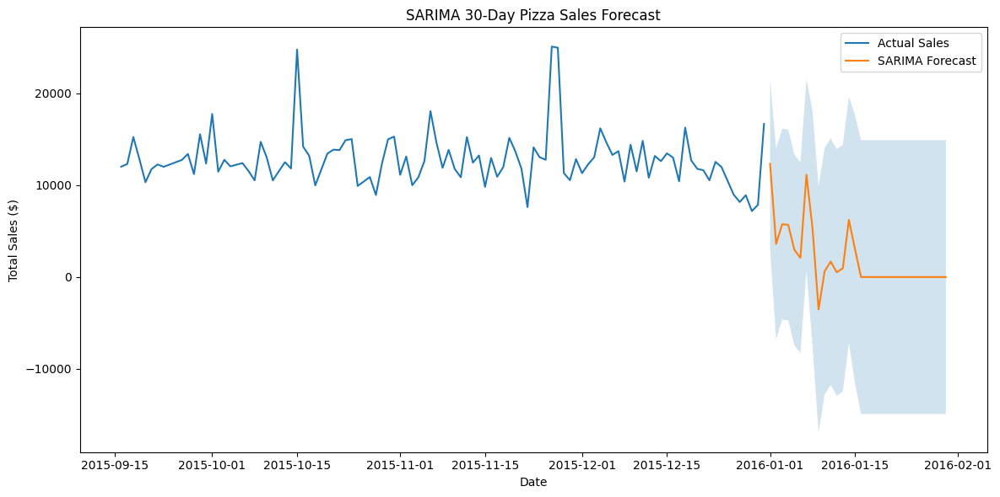

In [74]:
plt.figure(figsize=(12,6))
plt.plot(ts_series[-100:], label='Actual Sales')
plt.plot(forecast_df['date'], forecast_df['forecast'], label='SARIMA Forecast')
plt.fill_between(forecast_df['date'], forecast_df['lower_ci'], forecast_df['upper_ci'], alpha=0.2)
plt.title("SARIMA 30-Day Pizza Sales Forecast")
plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.legend()
plt.tight_layout()
plt.show()

In [75]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

In [76]:
# Extract the last 30 days as actual values for comparison
actual_values = ts_series[-30:].values

# SARIMA Forecast
sarima_forecast_values = forecast_df['forecast'].values

# Calculate MAPE, MAE, RMSE for SARIMA
mape_sarima = np.mean(np.abs((actual_values - sarima_forecast_values) / actual_values)) * 100
mae_sarima = mean_absolute_error(actual_values, sarima_forecast_values)
rmse_sarima = np.sqrt(mean_squared_error(actual_values, sarima_forecast_values))

# Print Results for SARIMA
print(f"SARIMA - MAE: {mae_sarima:.2f}, RMSE: {rmse_sarima:.2f}, MAPE: {mape_sarima:.2f}%")

SARIMA - MAE: 10263.96, RMSE: 10891.82, MAPE: 85.19%


In [77]:
# Run auto_arima without seasonality
arima_model = auto_arima(
    ts_series,
    seasonal=False,  # <--- This disables SARIMA behavior
    trace=True,
    suppress_warnings=True
)

arima_model.summary()

C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=7803.318, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=6776.965, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=7454.445, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=6722.353, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.05 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=inf, Time=0.08 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,0,1)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=6566.831, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=6568.502, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=6567.695, Time=0.12 sec


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=6569.112, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=6569.426, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=6569.696, Time=0.15 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 1.373 seconds


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  358
Model:               SARIMAX(2, 0, 0)   Log Likelihood               -3279.415
Date:                Sun, 27 Apr 2025   AIC                           6566.831
Time:                        15:36:16   BIC                           6582.353
Sample:                             0   HQIC                          6573.004
                                - 358                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.272e+04    844.695     15.059      0.000    1.11e+04    1.44e+04
ar.L1          0.1129      0.033      3.405      0.001       0.048       0.178
ar.L2         -0.1032      0.062     -1.653      0.098      -0.226       0.019
sigma2      5.292e+06      0.027   1.95e+08      0.000    5.29e+06    5.29e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               469.48
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               2.20   Skew:                             1.28
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.01e+24. Standard errors may be unstable.
"""

In [78]:
# Fit ARIMA model
model_arima = SARIMAX(ts_series, order=arima_model.order)
arima_result = model_arima.fit()

# Forecast next 30 days
forecast_arima = arima_result.get_forecast(steps=30)
forecast_index_arima = pd.date_range(ts_series.index[-1] + pd.Timedelta(days=1), periods=30)

# Build DataFrame
forecast_df_arima = pd.DataFrame({
    'date': forecast_index_arima,
    'forecast': forecast_arima.predicted_mean,
    'lower_ci': forecast_arima.conf_int().iloc[:, 0],
    'upper_ci': forecast_arima.conf_int().iloc[:, 1]
})

C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported

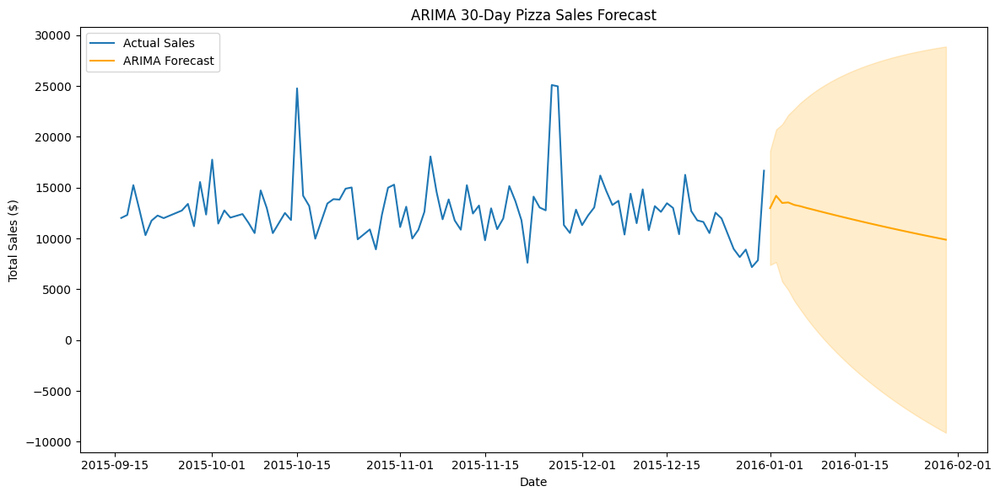

In [79]:
plt.figure(figsize=(12,6))
plt.plot(ts_series[-100:], label='Actual Sales')
plt.plot(forecast_df_arima['date'], forecast_df_arima['forecast'], label='ARIMA Forecast', color='orange')
plt.fill_between(forecast_df_arima['date'], forecast_df_arima['lower_ci'], forecast_df_arima['upper_ci'], alpha=0.2, color='orange')
plt.title("ARIMA 30-Day Pizza Sales Forecast")
plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.legend()
plt.tight_layout()
plt.show()

In [80]:
# Extract the last 30 days as actual values for comparison
actual_values = ts_series[-30:].values

# ARIMA Forecast
arima_forecast_values = forecast_df_arima['forecast'].values

# Calculate MAPE, MAE, RMSE for ARIMA
mape_arima = np.mean(np.abs((actual_values - arima_forecast_values) / actual_values)) * 100
mae_arima = mean_absolute_error(actual_values, arima_forecast_values)
rmse_arima = np.sqrt(mean_squared_error(actual_values, arima_forecast_values))

# Print Results for ARIMA
print(f"ARIMA - MAE: {mae_arima:.2f}, RMSE: {rmse_arima:.2f}, MAPE: {mape_arima:.2f}%")

ARIMA - MAE: 1724.71, RMSE: 2169.93, MAPE: 14.50%


In [81]:
daily_data['date'] = pd.to_datetime(daily_data['date'])
daily_data['day_of_week'] = daily_data['date'].dt.day_name()
daily_data['month'] = daily_data['date'].dt.month_name()
daily_data['day'] = daily_data['date'].dt.day
daily_data['is_weekend'] = daily_data['day_of_week'].isin(['Saturday', 'Sunday']).astype(int)

In [82]:
# One-hot encoding
data_encoded = pd.get_dummies(daily_data, columns=['day_of_week', 'month'], drop_first=True)

# Optional: Drop date column
data_encoded = data_encoded.drop(columns=['date'])

In [83]:
daily_data.head()

,date,total_price,quantity,day_of_week,month,is_weekend,day
0,2015-01-01,15606.00,917,Thursday,January,0,1
1,2015-01-02,15379.00,906,Friday,January,0,2
2,2015-01-03,15047.65,871,Saturday,January,1,3
3,2015-01-04,9847.30,586,Sunday,January,1,4
4,2015-01-05,11573.30,687,Monday,January,0,5


In [84]:
# Prepare feature and target
X = data_encoded.drop('total_price', axis=1)
y = data_encoded['total_price']

# Use last 30 records as test
X_train, X_test = X[:-30], X[-30:]
y_train, y_test = y[:-30], y[-30:]

In [85]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Train the model
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Predict
y_pred = xgb_model.predict(X_test)

In [86]:
# Evaluation
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2f}%")

MAE: 307.26
RMSE: 375.17
MAPE: 2.56%


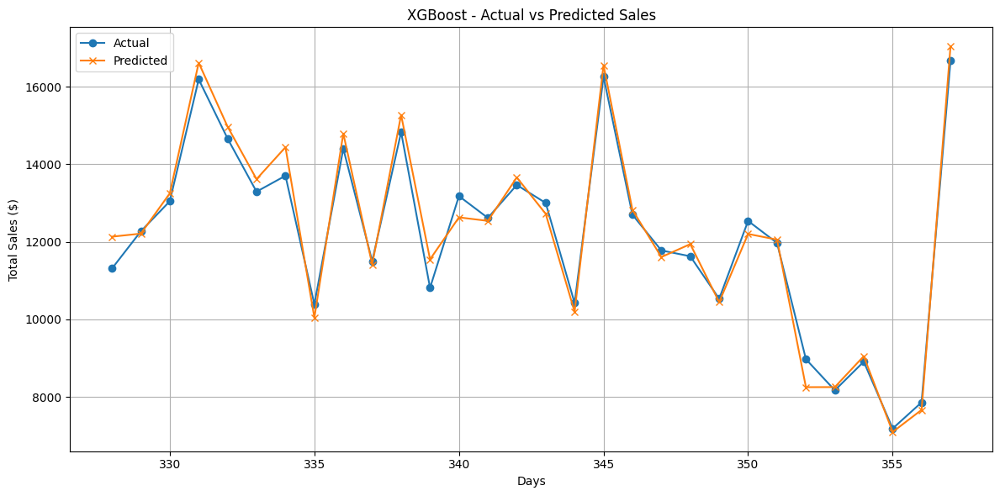

In [87]:
plt.figure(figsize=(12,6))
plt.plot(y_test.index, y_test.values, label='Actual', marker='o')
plt.plot(y_test.index, y_pred, label='Predicted', marker='x')
plt.title("XGBoost - Actual vs Predicted Sales")
plt.xlabel("Days")
plt.ylabel("Total Sales ($)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [88]:
# STEP 1: Create future dates to predict
future_dates = pd.date_range(start=daily_data['date'].max() + pd.Timedelta(days=1), periods=7)

# STEP 2: Create future DataFrame with time features
future_df = pd.DataFrame({'date': future_dates})
future_df['day_of_week'] = future_df['date'].dt.day_name()
future_df['month'] = future_df['date'].dt.month_name()
future_df['day'] = future_df['date'].dt.day
future_df['is_weekend'] = future_df['day_of_week'].isin(['Saturday', 'Sunday']).astype(int)

# STEP 3: One-hot encode with same structure as training
future_encoded = pd.get_dummies(future_df, columns=['day_of_week', 'month'], drop_first=True)

# Align columns with X_train
missing_cols = set(X_train.columns) - set(future_encoded.columns)
for col in missing_cols:
    future_encoded[col] = 0  # Add missing columns with 0

# Ensure same column order
future_encoded = future_encoded[X_train.columns]

In [89]:
xgb_forecast = xgb_model.predict(future_encoded)

forecast_df_xgb = pd.DataFrame({
    'date': future_df['date'],
    'forecast': xgb_forecast
})

forecast_df_xgb

,date,forecast
0,2016-01-01,7135.833984
1,2016-01-02,7136.787598
2,2016-01-03,7144.453613
3,2016-01-04,7142.019043
4,2016-01-05,7123.701660
5,2016-01-06,7091.334961
6,2016-01-07,7088.443848


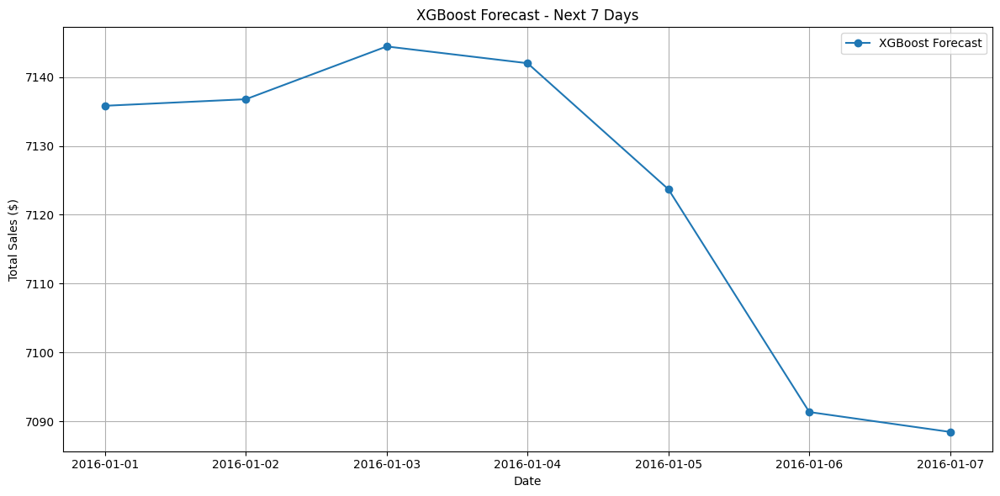

In [90]:
plt.figure(figsize=(12,6))
plt.plot(forecast_df_xgb['date'], forecast_df_xgb['forecast'], marker='o', label='XGBoost Forecast')
plt.title("XGBoost Forecast - Next 7 Days")
plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [91]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Use total_price for modeling
target_series = daily_data[['total_price']].copy()

# Scale the target
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(target_series)

In [92]:
# Function to create sequences
def create_sequences(data, window=30):
    X, y = [], []
    for i in range(window, len(data)):
        X.append(data[i-window:i])
        y.append(data[i])
    return np.array(X), np.array(y)

X, y = create_sequences(scaled_data, window=30)

In [93]:
# Use last 30 days as test
X_train, X_test = X[:-30], X[-30:]
y_train, y_test = y[:-30], y[-30:]

In [94]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Build model
model = Sequential([
    LSTM(64, activation='relu', input_shape=(X_train.shape[1], 1)),
    Dense(1)
])

# Compile
model.compile(optimizer='adam', loss='mse')

# Train
history = model.fit(X_train, y_train, epochs=20, batch_size=16, validation_split=0.1, verbose=1)

Epoch 1/20


C:\Users\91701\anaconda3\envs\cleanenv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0799 - val_loss: 0.0435
Epoch 2/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0195 - val_loss: 0.0459
Epoch 3/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0146 - val_loss: 0.0433
Epoch 4/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0138 - val_loss: 0.0436
Epoch 5/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0160 - val_loss: 0.0433
Epoch 6/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0128 - val_loss: 0.0432
Epoch 7/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0125 - val_loss: 0.0433
Epoch 8/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0165 - val_loss: 0.0436
Epoch 9/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0162 - val_loss: 0.0430
Epoch 10/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0158 - val_loss: 0.0437
Epoch 11/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0182 - val_loss: 0.0433
Epoch 12/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0119 - val_loss: 0.0428

In [95]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Build model
model = Sequential([
    LSTM(64, activation='relu', input_shape=(X_train.shape[1], 1)),
    Dense(1)
])

# Compile
model.compile(optimizer='adam', loss='mse')

# Train
history = model.fit(X_train, y_train, epochs=20, batch_size=16, validation_split=0.1, verbose=1)

Epoch 1/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.1047 - val_loss: 0.0486
Epoch 2/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0152 - val_loss: 0.0465
Epoch 3/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0221 - val_loss: 0.0436
Epoch 4/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0148 - val_loss: 0.0434
Epoch 5/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0128 - val_loss: 0.0436
Epoch 6/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0129 - val_loss: 0.0434
Epoch 7/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0147 - val_loss: 0.0432
Epoch 8/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0145 - val_loss: 0.0437
Epoch 9/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0146 - val_loss: 0.0431
Epoch 10/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0161 - val_loss: 0.0434
Epoch 11/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0169 - val_loss: 0.0443
Epoch 12/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0151 - val_l

In [96]:
# Predict
y_pred = model.predict(X_test)

# Invert scaling
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


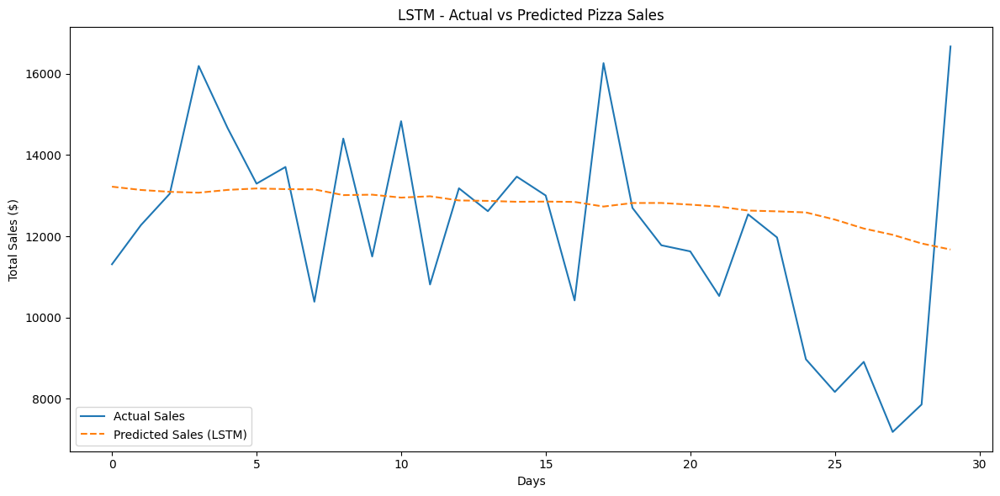

In [97]:
plt.figure(figsize=(12,6))
plt.plot(range(len(y_test_inv)), y_test_inv, label='Actual Sales')
plt.plot(range(len(y_pred_inv)), y_pred_inv, label='Predicted Sales (LSTM)', linestyle='--')
plt.title("LSTM - Actual vs Predicted Pizza Sales")
plt.xlabel("Days")
plt.ylabel("Total Sales ($)")
plt.legend()
plt.tight_layout()
plt.show()

In [98]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae_lstm = mean_absolute_error(y_test_inv, y_pred_inv)
rmse_lstm = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
mape_lstm = np.mean(np.abs((y_test_inv - y_pred_inv) / y_test_inv)) * 100

print(f"LSTM MAE: {mae_lstm:.2f}")
print(f"LSTM RMSE: {rmse_lstm:.2f}")
print(f"LSTM MAPE: {mape_lstm:.2f}%")

LSTM MAE: 1844.31
LSTM RMSE: 2377.28
LSTM MAPE: 17.32%


In [99]:
# Start with last 30 days of scaled data
last_sequence = scaled_data[-30:]  # Shape: (30, 1)
future_preds = []

current_input = last_sequence.reshape(1, 30, 1)

for _ in range(7):  # Predict next 7 days
    next_pred = model.predict(current_input, verbose=0)[0][0]
    future_preds.append(next_pred)

    # Update the current_input for the next step
    current_input = np.append(current_input[:, 1:, :], [[[next_pred]]], axis=1)

# Inverse scale
future_preds_inv = scaler.inverse_transform(np.array(future_preds).reshape(-1, 1)).flatten()

# Create date range
future_dates = pd.date_range(start=daily_data['date'].max() + pd.Timedelta(days=1), periods=7)

# Final forecast DataFrame
forecast_df_lstm = pd.DataFrame({
    'date': future_dates,
    'forecast': future_preds_inv
})

forecast_df_lstm

,date,forecast
0,2016-01-01,11877.818359
1,2016-01-02,11966.049805
2,2016-01-03,12031.749023
3,2016-01-04,12084.898438
4,2016-01-05,12125.591797
5,2016-01-06,12161.923828
6,2016-01-07,12195.063477


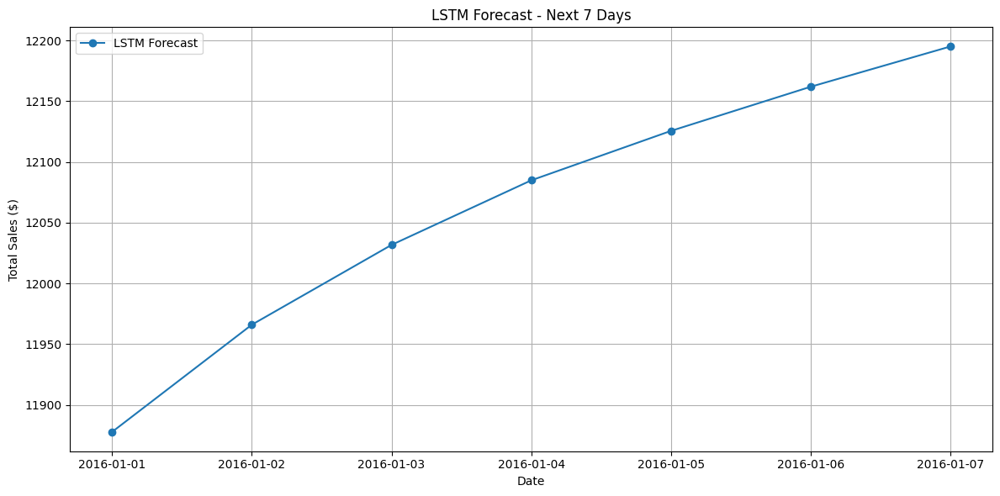

In [100]:
plt.figure(figsize=(12,6))
plt.plot(forecast_df_lstm['date'], forecast_df_lstm['forecast'], marker='o', label='LSTM Forecast')
plt.title("LSTM Forecast - Next 7 Days")
plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [101]:
forecast_df_prophet.head()

,ds,yhat,yhat_lower,yhat_upper
378,2016-01-21,13339.070666,10884.784002,15725.579976
379,2016-01-22,15226.170605,12742.047758,17890.839667
380,2016-01-23,13269.305134,10773.930488,15574.882689
381,2016-01-24,10624.511016,8092.724396,12943.412976
382,2016-01-25,12594.918025,10242.309692,15351.806513


In [102]:
forecast_df.head()

,date,forecast,lower_ci,upper_ci
358,2016-01-01,12332.905085,3139.734535,21526.075635
359,2016-01-02,3598.179108,-6792.556591,13988.914806
360,2016-01-03,5756.737828,-4633.997871,16147.473527
361,2016-01-04,5682.206282,-4708.529417,16072.941981
362,2016-01-05,2979.212868,-7411.522831,13369.948567


In [103]:
forecast_df_arima.head()

,date,forecast,lower_ci,upper_ci
358,2016-01-01,12987.823227,7386.831076,18588.815378
359,2016-01-02,14198.448373,7676.301591,20720.595156
360,2016-01-03,13495.384002,5759.256375,21231.511629
361,2016-01-04,13544.218201,4936.200332,22152.236071
362,2016-01-05,13301.387430,3866.856032,22735.918827


In [104]:
forecast_df_xgb.head()

,date,forecast
0,2016-01-01,7135.833984
1,2016-01-02,7136.787598
2,2016-01-03,7144.453613
3,2016-01-04,7142.019043
4,2016-01-05,7123.701660


In [105]:
forecast_df_lstm.head()

,date,forecast
0,2016-01-01,11877.818359
1,2016-01-02,11966.049805
2,2016-01-03,12031.749023
3,2016-01-04,12084.898438
4,2016-01-05,12125.591797


In [106]:
merged_data.head()

,pizza_id,order_id,pizza_name_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_name,pizza_ingredients,Items_Qty_In_Grams,order_datetime,date,day_of_week,month,order_hour,is_weekend
0,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Sliced Ham,NaN,2015-01-01 11:38:36,2015-01-01,Thursday,January,11,False
1,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Pineapple,30.0,2015-01-01 11:38:36,2015-01-01,Thursday,January,11,False
2,1,1,hawaiian_m,1,1/1/2015,11:38:36,13.25,13.25,M,Classic,The Hawaiian Pizza,Mozzarella Cheese,20.0,2015-01-01 11:38:36,2015-01-01,Thursday,January,11,False
3,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Pepperoni,40.0,2015-01-01 11:57:40,2015-01-01,Thursday,January,11,False
4,2,2,classic_dlx_m,1,1/1/2015,11:57:40,16.00,16.00,M,Classic,The Classic Deluxe Pizza,Mushrooms,40.0,2015-01-01 11:57:40,2015-01-01,Thursday,January,11,False


In [107]:
daily_data.head()

,date,total_price,quantity,day_of_week,month,is_weekend,day
0,2015-01-01,15606.00,917,Thursday,January,0,1
1,2015-01-02,15379.00,906,Friday,January,0,2
2,2015-01-03,15047.65,871,Saturday,January,1,3
3,2015-01-04,9847.30,586,Sunday,January,1,4
4,2015-01-05,11573.30,687,Monday,January,0,5


In [108]:
# Total quantity sold per pizza type (all sizes)
pizza_share = merged_data.groupby('pizza_name_id')['quantity'].sum()

# Normalize to get percentage share
pizza_share = pizza_share / pizza_share.sum()

In [109]:
# XGBoost (from earlier setup)
# From historical data
avg_price_per_pizza = daily_data['total_price'].sum() / daily_data['quantity'].sum()

# Sum XGBoost predicted total sales over 7 days
xgb_7day_sales = np.sum(y_pred[-7:])  # Assuming y_pred holds recent predictions

# Estimated quantity = sales / avg price
xgb_7day_quantity = xgb_7day_sales / avg_price_per_pizza

In [110]:
# Use the first 7 rows of XGBoost forecasted sales
xgb_7day_sales = forecast_df_xgb['forecast'].iloc[:7].sum()
xgb_7day_quantity = xgb_7day_sales / avg_price_per_pizza

In [111]:
# ARIMA
# Assuming forecast_df_arima has 30 days of forecast
arima_7day_sales = forecast_df_arima['forecast'].iloc[:7].sum()
arima_7day_quantity = arima_7day_sales / avg_price_per_pizza

In [112]:
# Prophet
# prophet_forecast[['ds', 'yhat']]  <-- this is standard
prophet_7day_sales = forecast_df_prophet['yhat'].iloc[:7].sum()
prophet_7day_quantity = prophet_7day_sales / avg_price_per_pizza

In [113]:
print("Estimated pizzas sold over next 7 days:")
print(f"XGBoost: {xgb_7day_quantity:.0f}")
print(f"ARIMA: {arima_7day_quantity:.0f}")
print(f"Prophet: {prophet_7day_quantity:.0f}")

Estimated pizzas sold over next 7 days:
XGBoost: 2957
ARIMA: 5557
Prophet: 5316


In [114]:
# Step 1: Average grams used per ingredient per pizza_name_id
ingredient_usage = (
    merged_data.groupby(['pizza_name_id', 'pizza_ingredients'])['Items_Qty_In_Grams']
    .mean()
    .reset_index()
)

In [115]:
def generate_purchase_order(forecasted_quantity, label):
    """
    Function to generate a purchase order based on forecasted quantity.
    """

    # Step 1: Estimate number of pizzas per type
    pizza_counts = pizza_share * forecasted_quantity
    pizza_counts = pizza_counts.reset_index()
    pizza_counts.columns = ['pizza_name_id', 'estimated_quantity']

    # Step 2: Merge with ingredient usage
    ingredient_needs = pd.merge(pizza_counts, ingredient_usage, on='pizza_name_id')

    # Step 3: Calculate total quantity required for each ingredient
    ingredient_needs['total_grams'] = (
        ingredient_needs['estimated_quantity'] * ingredient_needs['Items_Qty_In_Grams']
    )

    # Step 4: Group by ingredient and sum
    purchase_order = (
        ingredient_needs.groupby('pizza_ingredients')['total_grams']
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    # Optional: Add model label
    purchase_order['model'] = label

    return purchase_order 

# Forecasted quantities from the models
xgb_forecasted_quantity = 2957
arima_forecasted_quantity = 5557
prophet_forecasted_quantity = 5316

# Generate purchase orders for each model
purchase_order_xgb = generate_purchase_order(xgb_forecasted_quantity, 'XGBoost')
purchase_order_arima = generate_purchase_order(arima_forecasted_quantity, 'ARIMA')
purchase_order_prophet = generate_purchase_order(prophet_forecasted_quantity, 'Prophet')

# Display the purchase orders
print("XGBoost Purchase Order:")
print(purchase_order_xgb.head())

print("\nARIMA Purchase Order:")
print(purchase_order_arima.head())

print("\nProphet Purchase Order:")
print(purchase_order_prophet.head())

XGBoost Purchase Order:
  pizza_ingredients   total_grams    model
0           Chicken  67819.867241  XGBoost
1        Red Onions  59980.441918  XGBoost
2         Capocollo  50237.822316  XGBoost
3          Tomatoes  40583.367782  XGBoost
4             Bacon  24101.163106  XGBoost

ARIMA Purchase Order:
  pizza_ingredients    total_grams  model
0           Chicken  127451.810030  ARIMA
1        Red Onions  112719.416888  ARIMA
2         Capocollo   94410.408728  ARIMA
3          Tomatoes   76267.086495  ARIMA
4             Bacon   45292.581461  ARIMA

Prophet Purchase Order:
  pizza_ingredients    total_grams    model
0           Chicken  121924.387641  Prophet
1        Red Onions  107830.919593  Prophet
2         Capocollo   90315.949757  Prophet
3          Tomatoes   72959.480260  Prophet
4             Bacon   43328.299991  Prophet


In [116]:
def generate_purchase_order(forecasted_quantity, label):
    # Step 1: Estimate number of pizzas per type
    pizza_counts = pizza_share * forecasted_quantity
    pizza_counts = pizza_counts.reset_index()
    pizza_counts.columns = ['pizza_name_id', 'estimated_quantity']

    # Step 2: Merge with ingredient usage
    ingredient_needs = pd.merge(pizza_counts, ingredient_usage, on='pizza_name_id')

    # Step 3: Calculate total quantity required for each ingredient
    ingredient_needs['total_grams'] = (
        ingredient_needs['estimated_quantity'] * ingredient_needs['Items_Qty_In_Grams']
    )

    # Step 4: Group by ingredient and sum
    purchase_order = (
        ingredient_needs.groupby('pizza_ingredients')['total_grams']
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    # Optional: Add model label
    purchase_order['model'] = label

    return purchase_order

In [117]:
purchase_order_xgb = generate_purchase_order(2957, 'XGBoost')
purchase_order_arima = generate_purchase_order(5557, 'ARIMA')

In [118]:
print("XGBoost Purchase Order:")
print(purchase_order_xgb.head())

print("\nARIMA Purchase Order:")
print(purchase_order_arima.head())

XGBoost Purchase Order:
  pizza_ingredients   total_grams    model
0           Chicken  67819.867241  XGBoost
1        Red Onions  59980.441918  XGBoost
2         Capocollo  50237.822316  XGBoost
3          Tomatoes  40583.367782  XGBoost
4             Bacon  24101.163106  XGBoost

ARIMA Purchase Order:
  pizza_ingredients    total_grams  model
0           Chicken  127451.810030  ARIMA
1        Red Onions  112719.416888  ARIMA
2         Capocollo   94410.408728  ARIMA
3          Tomatoes   76267.086495  ARIMA
4             Bacon   45292.581461  ARIMA


In [119]:
# 1. Ingredient usage per pizza
ingredient_usage = (
    merged_data.groupby(['pizza_name_id', 'pizza_ingredients'])['Items_Qty_In_Grams']
    .mean()
    .reset_index()
)

# 2. Pizza share across all pizzas
pizza_share = merged_data.groupby('pizza_name_id')['quantity'].sum()
pizza_share = pizza_share / pizza_share.sum()

In [120]:
#  XGBoost Purchase Order
# Forecasted quantity from XGBoost
xgb_quantity = 2957

# Estimate pizzas per type
xgb_pizza_counts = (pizza_share * xgb_quantity).reset_index()
xgb_pizza_counts.columns = ['pizza_name_id', 'estimated_quantity']

# Merge with ingredient usage
xgb_ingredients = pd.merge(xgb_pizza_counts, ingredient_usage, on='pizza_name_id')

# Total grams required
xgb_ingredients['total_grams'] = xgb_ingredients['estimated_quantity'] * xgb_ingredients['Items_Qty_In_Grams']

# Final purchase order grouped by ingredient
purchase_order_xgb = xgb_ingredients.groupby('pizza_ingredients')['total_grams'] \
                                     .sum().sort_values(ascending=False).reset_index()

print("📦 XGBoost - 7 Day Purchase Order:")
print(purchase_order_xgb.head())

📦 XGBoost - 7 Day Purchase Order:
  pizza_ingredients   total_grams
0           Chicken  67819.867241
1        Red Onions  59980.441918
2         Capocollo  50237.822316
3          Tomatoes  40583.367782
4             Bacon  24101.163106


In [121]:
# Format the total grams to a more readable format
purchase_order_xgb['total_grams'] = purchase_order_xgb['total_grams'].apply(lambda x: f"{x:,.0f}")

# Display the formatted purchase order
print("📦 XGBoost - 7 Day Purchase Order:")
print(purchase_order_xgb.head())

📦 XGBoost - 7 Day Purchase Order:
  pizza_ingredients total_grams
0           Chicken      67,820
1        Red Onions      59,980
2         Capocollo      50,238
3          Tomatoes      40,583
4             Bacon      24,101


In [122]:
# ARIMA Purchase Order
# Forecasted quantity from ARIMA
arima_quantity = 5557

# Estimate pizzas per type
arima_pizza_counts = (pizza_share * arima_quantity).reset_index()
arima_pizza_counts.columns = ['pizza_name_id', 'estimated_quantity']

# Merge with ingredient usage
arima_ingredients = pd.merge(arima_pizza_counts, ingredient_usage, on='pizza_name_id')

# Total grams required
arima_ingredients['total_grams'] = arima_ingredients['estimated_quantity'] * arima_ingredients['Items_Qty_In_Grams']

# Final purchase order grouped by ingredient
purchase_order_arima = arima_ingredients.groupby('pizza_ingredients')['total_grams'] \
                                        .sum().sort_values(ascending=False).reset_index()

print("📦 ARIMA - 7 Day Purchase Order:")
print(purchase_order_arima.head())

📦 ARIMA - 7 Day Purchase Order:
  pizza_ingredients    total_grams
0           Chicken  127451.810030
1        Red Onions  112719.416888
2         Capocollo   94410.408728
3          Tomatoes   76267.086495
4             Bacon   45292.581461


In [123]:
# Format the total grams to a more readable format for ARIMA
purchase_order_arima['total_grams'] = purchase_order_arima['total_grams'].apply(lambda x: f"{x:,.0f}")

# Display the formatted ARIMA purchase order
print("📦 ARIMA - 7 Day Purchase Order:")
print(purchase_order_arima.head())

📦 ARIMA - 7 Day Purchase Order:
  pizza_ingredients total_grams
0           Chicken     127,452
1        Red Onions     112,719
2         Capocollo      94,410
3          Tomatoes      76,267
4             Bacon      45,293


In [124]:
# Prophet Purchase Order
# Forecasted quantity from Prophet
prophet_quantity = 5316

# Estimate pizzas per type
prophet_pizza_counts = (pizza_share * prophet_quantity).reset_index()
prophet_pizza_counts.columns = ['pizza_name_id', 'estimated_quantity']

# Merge with ingredient usage
prophet_ingredients = pd.merge(prophet_pizza_counts, ingredient_usage, on='pizza_name_id')

# Total grams required
prophet_ingredients['total_grams'] = prophet_ingredients['estimated_quantity'] * prophet_ingredients['Items_Qty_In_Grams']

# Final purchase order grouped by ingredient
purchase_order_prophet = prophet_ingredients.groupby('pizza_ingredients')['total_grams'] \
                                             .sum().sort_values(ascending=False).reset_index()

print("📦 Prophet - 7 Day Purchase Order:")
print(purchase_order_prophet.head())

📦 Prophet - 7 Day Purchase Order:
  pizza_ingredients    total_grams
0           Chicken  121924.387641
1        Red Onions  107830.919593
2         Capocollo   90315.949757
3          Tomatoes   72959.480260
4             Bacon   43328.299991


In [125]:
# Format the total grams to a more readable format for ARIMA
purchase_order_prophet['total_grams'] = purchase_order_prophet['total_grams'].apply(lambda x: f"{x:,.0f}")

# Display the formatted ARIMA purchase order
print("📦 Prophet - 7 Day Purchase Order:")
print(purchase_order_arima.head())

📦 Prophet - 7 Day Purchase Order:
  pizza_ingredients total_grams
0           Chicken     127,452
1        Red Onions     112,719
2         Capocollo      94,410
3          Tomatoes      76,267
4             Bacon      45,293


In [126]:
import plotly.express as px

# Sort and pick top 15 ingredients
data_sorted = purchase_order_xgb.sort_values('total_grams', ascending=False).head(15)

# Create horizontal bar chart
fig = px.bar(
    data_sorted,
    x='total_grams',
    y='pizza_ingredients',
    orientation='h',
    title='XGBoost - Top 15 Ingredients Needed (7 Days)',
    labels={'total_grams': 'Total Grams Required', 'pizza_ingredients': 'Ingredient'},
)

# Flip y-axis so the largest bar is at the top
fig.update_layout(yaxis={'categoryorder': 'total ascending'})

fig.show()

In [127]:
import plotly.express as px

# Sort and pick top 15 ingredients for ARIMA
data_sorted_arima = purchase_order_arima.sort_values('total_grams', ascending=False).head(15)

# Create horizontal bar chart with Plotly Express
fig = px.bar(
    data_sorted_arima,
    x='total_grams',
    y='pizza_ingredients',
    orientation='h',
    title='ARIMA - Top 15 Ingredients Needed (7 Days)',
    labels={'total_grams': 'Total Grams Required', 'pizza_ingredients': 'Ingredient'},
)

# Customize layout to flip bars to show the largest at the top
fig.update_layout(
    yaxis={'categoryorder': 'total ascending'},
    xaxis_title='Total Grams Required',
    yaxis_title='Ingredient',
)

fig.show()

In [128]:
import plotly.express as px

# Sort and pick top 15 ingredients for Prophet
data_sorted_prophet = purchase_order_prophet.sort_values('total_grams', ascending=False).head(15)

# Create horizontal bar chart with Plotly Express
fig = px.bar(
    data_sorted_prophet,
    x='total_grams',
    y='pizza_ingredients',
    orientation='h',
    title='Prophet - Top 15 Ingredients Needed (7 Days)',
    labels={'total_grams': 'Total Grams Required', 'pizza_ingredients': 'Ingredient'}, 
)

# Customize layout to flip bars to show the largest at the top
fig.update_layout(
    yaxis={'categoryorder': 'total ascending'},
    xaxis_title='Total Grams Required',
    yaxis_title='Ingredient',
)

fig.show()

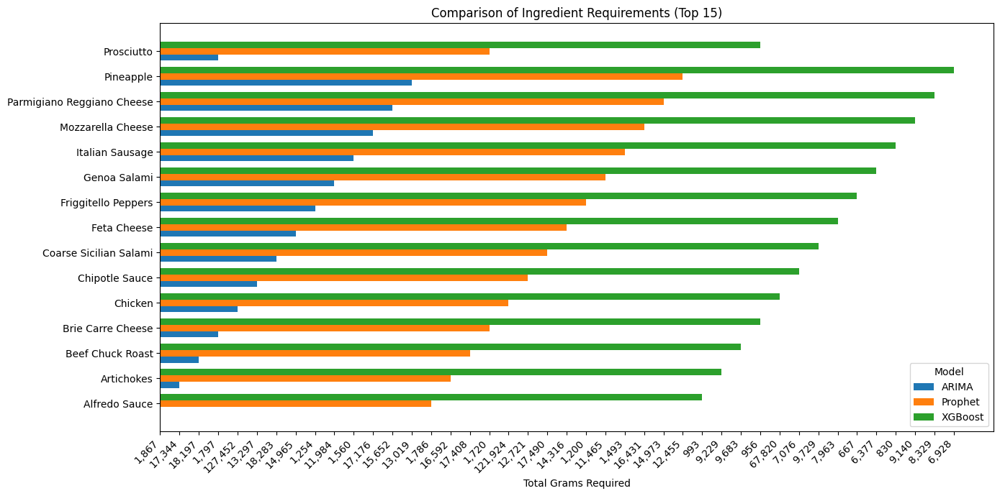

In [129]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

xgb_order_labeled = purchase_order_xgb.copy()
xgb_order_labeled['model'] = 'XGBoost'

arima_order_labeled = purchase_order_arima.copy()
arima_order_labeled['model'] = 'ARIMA'

prophet_order_labeled = purchase_order_prophet.copy()
prophet_order_labeled['model'] = 'Prophet'

# Combine
combined_orders = pd.concat([xgb_order_labeled, arima_order_labeled, prophet_order_labeled])

# Take top ingredients overall for clarity
top_ingredients = combined_orders.groupby('pizza_ingredients')['total_grams'].sum() \
                                 .sort_values(ascending=False).head(15).index

combined_filtered = combined_orders[combined_orders['pizza_ingredients'].isin(top_ingredients)]

# Prepare data
grouped = combined_filtered.groupby(['pizza_ingredients', 'model'])['total_grams'].sum().unstack(fill_value=0)
ingredients = grouped.index
models = grouped.columns
x = np.arange(len(ingredients))
width = 0.25  # Width of each bar

# Plot
plt.figure(figsize=(14, 7))
for i, model in enumerate(models):
    plt.barh(x + i * width, grouped[model], height=width, label=model)

plt.yticks(x + width, ingredients)
plt.xlabel('Total Grams Required')
plt.title('Comparison of Ingredient Requirements (Top 15)')
plt.legend(title='Model')

# Rotate x-axis tick labels
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()